### Exploratory Data Analysis (EDA) on King County Housing Data in Python

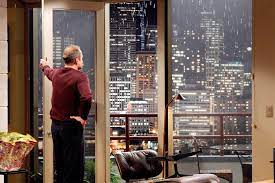

EDA is an extremely powerful method to perform investigations on a given data, thereby discovering patterns, anomalies and confirming/ rejecting
the hypothesis that we made on the data.

### Aim of this notebook 

This notebook contains an example EDA on King County Housing Data. We will go through the datasets, clean it, make 
hypothesis and confirm/reject those hypothesis based on the analysis.

The has been downloaded and is kept in the 'data' folder inside this working directory. More details about the data is given in 
Github (https://github.com/haritha-1234/EDA_project/blob/main/assignment.md). 

### The stakeholders
A stakeholder (Buyer/Seller) has to be chosen from the table given in the above repository in Github

- Stakeholder that I was interested in was Jacob Philips, a buyer.
- He has Unlimited Budget, 4+ bathrooms or smaller house nearby, big lot (tennis court & pool), golf, historic, no waterfront  

### Setup

Import all the needed libraries for this EDA

In [636]:
#Import warning so that it can be included in ignore
import warnings
warnings.filterwarnings("ignore")

#import all libraries for calculations and plotting 
import pandas as pd
import numpy as np
import datetime
import statistics
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

### Understanding your data 

In [637]:
#Import the data needed for the EDA and see the data in general
king_county_df = pd.read_csv('data/King_County_House_Prices_dataset.csv')
king_county_df.head(50)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,NaN,0.000,...,7,1180,0.0,1955,0.000,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0.000,0.000,...,7,2170,400.0,1951,1991.000,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0.000,0.000,...,6,770,0.0,1933,NaN,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0.000,0.000,...,7,1050,910.0,1965,0.000,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0.000,0.000,...,8,1680,0.0,1987,0.000,98074,47.617,-122.045,1800,7503
5,7237550310,5/12/2014,1230000.000,4,4.500,5420,101930,1.000,0.000,0.000,...,11,3890,1530.0,2001,0.000,98053,47.656,-122.005,4760,101930
6,1321400060,6/27/2014,257500.000,3,2.250,1715,6819,2.000,0.000,0.000,...,7,1715,?,1995,0.000,98003,47.310,-122.327,2238,6819
7,2008000270,1/15/2015,291850.000,3,1.500,1060,9711,1.000,0.000,NaN,...,7,1060,0.0,1963,0.000,98198,47.410,-122.315,1650,9711
8,2414600126,4/15/2015,229500.000,3,1.000,1780,7470,1.000,0.000,0.000,...,7,1050,730.0,1960,0.000,98146,47.512,-122.337,1780,8113
9,3793500160,3/12/2015,323000.000,3,2.500,1890,6560,2.000,0.000,0.000,...,7,1890,0.0,2003,0.000,98038,47.368,-122.031,2390,7570


In [638]:
#Get more information on the data types of each columns
king_county_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [777]:
#Get the mean of each column:
king_county_df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price(log)
count,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000
mean,4580474287.771,540296.574,3.373,2.116,2080.322,15099.409,1.494,0.007,0.233,3.410,7.658,1788.597,1971.000,68.758,98077.952,47.560,-122.214,1986.620,12758.284,5.667
std,2876735715.748,367368.140,0.926,0.769,918.106,41412.637,0.540,0.082,0.765,0.651,1.173,827.760,29.375,364.037,53.513,0.139,0.141,685.230,27274.442,0.229
min,1000102.000,78000.000,1.000,0.500,370.000,520.000,1.000,0.000,0.000,1.000,3.000,370.000,1900.000,0.000,98001.000,47.156,-122.519,399.000,651.000,4.892
25%,2123049175.000,322000.000,3.000,1.750,1430.000,5040.000,1.000,0.000,0.000,3.000,7.000,1190.000,1951.000,0.000,98033.000,47.471,-122.328,1490.000,5100.000,5.508
50%,3904930410.000,450000.000,3.000,2.250,1910.000,7618.000,1.500,0.000,0.000,3.000,7.000,1560.000,1975.000,0.000,98065.000,47.572,-122.231,1840.000,7620.000,5.653
75%,7308900490.000,645000.000,4.000,2.500,2550.000,10685.000,2.000,0.000,0.000,4.000,8.000,2210.000,1997.000,0.000,98118.000,47.678,-122.125,2360.000,10083.000,5.810
max,9900000190.000,7700000.000,33.000,8.000,13540.000,1651359.000,3.500,1.000,4.000,5.000,13.000,9410.000,2015.000,2015.000,98199.000,47.778,-121.315,6210.000,871200.000,6.886


### Initial hypothesis/ assumptions about datasets

From the different column names given in the overall dataset shown above, the assumptions that I would make is:

1) The price of the houses should have a correlation with the year in which they built (Price should be higher for the houses that 
has built in the later years)

2) The features of the houses like size, no. of rooms will be related to the price of the houses (Houses with higher no of rooms and living 
areas should have higher price)

3) The location of the houses will have a huge impact on the price of those houses irrespective of the size of the house (Houses in big cities and 
near touristic places or seaside will be expensive)

### Cleaning the datasets

Convert the date to a datetime format

In [639]:
king_county_df['date'] = pd.to_datetime(king_county_df.date)
#king_county_df['date'] = king_county_df['date'].dt.to_period('M')
#king_county_df['date'] = king_county_df['date'].astype(str)
king_county_df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.000,3,1.000,1180,5650,1.000,NaN,0.000,...,7,1180,0.0,1955,0.000,98178,47.511,-122.257,1340,5650
1,6414100192,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0.000,0.000,...,7,2170,400.0,1951,1991.000,98125,47.721,-122.319,1690,7639
2,5631500400,2015-02-25,180000.000,2,1.000,770,10000,1.000,0.000,0.000,...,6,770,0.0,1933,NaN,98028,47.738,-122.233,2720,8062
3,2487200875,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0.000,0.000,...,7,1050,910.0,1965,0.000,98136,47.521,-122.393,1360,5000
4,1954400510,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0.000,0.000,...,8,1680,0.0,1987,0.000,98074,47.617,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,2014-05-21,360000.000,3,2.500,1530,1131,3.000,0.000,0.000,...,8,1530,0.0,2009,0.000,98103,47.699,-122.346,1530,1509
21593,6600060120,2015-02-23,400000.000,4,2.500,2310,5813,2.000,0.000,0.000,...,8,2310,0.0,2014,0.000,98146,47.511,-122.362,1830,7200
21594,1523300141,2014-06-23,402101.000,2,0.750,1020,1350,2.000,0.000,0.000,...,7,1020,0.0,2009,0.000,98144,47.594,-122.299,1020,2007
21595,291310100,2015-01-16,400000.000,3,2.500,1600,2388,2.000,NaN,0.000,...,8,1600,0.0,2004,0.000,98027,47.535,-122.069,1410,1287


We see that the dataset consists of unknown values(like '?') and NaN values which has to be set to 0.0. Also the date has to be converted in to a 
datetime format

In [640]:
#Replace NaN values with 0.0
king_county_df = king_county_df.fillna(0)
#replace columns with'?' with 0.0
king_county_df = king_county_df.replace(to_replace='?', value='0.0')
king_county_df.head(20)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0.000,0.000,...,7,1180,0.0,1955,0.000,98178,47.511,-122.257,1340,5650
1,6414100192,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0.000,0.000,...,7,2170,400.0,1951,1991.000,98125,47.721,-122.319,1690,7639
2,5631500400,2015-02-25,180000.000,2,1.000,770,10000,1.000,0.000,0.000,...,6,770,0.0,1933,0.000,98028,47.738,-122.233,2720,8062
3,2487200875,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0.000,0.000,...,7,1050,910.0,1965,0.000,98136,47.521,-122.393,1360,5000
4,1954400510,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0.000,0.000,...,8,1680,0.0,1987,0.000,98074,47.617,-122.045,1800,7503
5,7237550310,2014-05-12,1230000.000,4,4.500,5420,101930,1.000,0.000,0.000,...,11,3890,1530.0,2001,0.000,98053,47.656,-122.005,4760,101930
6,1321400060,2014-06-27,257500.000,3,2.250,1715,6819,2.000,0.000,0.000,...,7,1715,0.0,1995,0.000,98003,47.310,-122.327,2238,6819
7,2008000270,2015-01-15,291850.000,3,1.500,1060,9711,1.000,0.000,0.000,...,7,1060,0.0,1963,0.000,98198,47.410,-122.315,1650,9711
8,2414600126,2015-04-15,229500.000,3,1.000,1780,7470,1.000,0.000,0.000,...,7,1050,730.0,1960,0.000,98146,47.512,-122.337,1780,8113
9,3793500160,2015-03-12,323000.000,3,2.500,1890,6560,2.000,0.000,0.000,...,7,1890,0.0,2003,0.000,98038,47.368,-122.031,2390,7570


### Questions

1) Is their any relationship between the year built and the price (prediction target) of those houses?
2) How many houses with more than 3 bedrooms and 3 bathrooms were sold? 
3) What is the location of the houses which were sold for a price greater than the mean price of the houses?

- I was wondering may be the stakeholder that I chose above can answer my questions
- Assumptions about the answers they would give will be made at the end

In [642]:
# Look at the unique years the houses has been built 
median_year = pd.unique(king_county_df['yr_built'])
print(pd.unique(king_county_df['yr_built']))
print(len(pd.unique(king_county_df['yr_built'])))


[1955 1951 1933 1965 1987 2001 1995 1963 1960 2003 1942 1927 1977 1900
 1979 1994 1916 1921 1969 1947 1968 1985 1941 1915 1909 1948 2005 1929
 1981 1930 1904 1996 2000 1984 2014 1922 1959 1966 1953 1950 2008 1991
 1954 1973 1925 1989 1972 1986 1956 2002 1992 1964 1952 1961 2006 1988
 1962 1939 1946 1967 1975 1980 1910 1983 1978 1905 1971 2010 1945 1924
 1990 1914 1926 2004 1923 2007 1976 1949 1999 1901 1993 1920 1997 1943
 1957 1940 1918 1928 1974 1911 1936 1937 1982 1908 1931 1998 1913 2013
 1907 1958 2012 1912 2011 1917 1932 1944 1902 2009 1903 1970 2015 1934
 1938 1919 1906 1935]
116


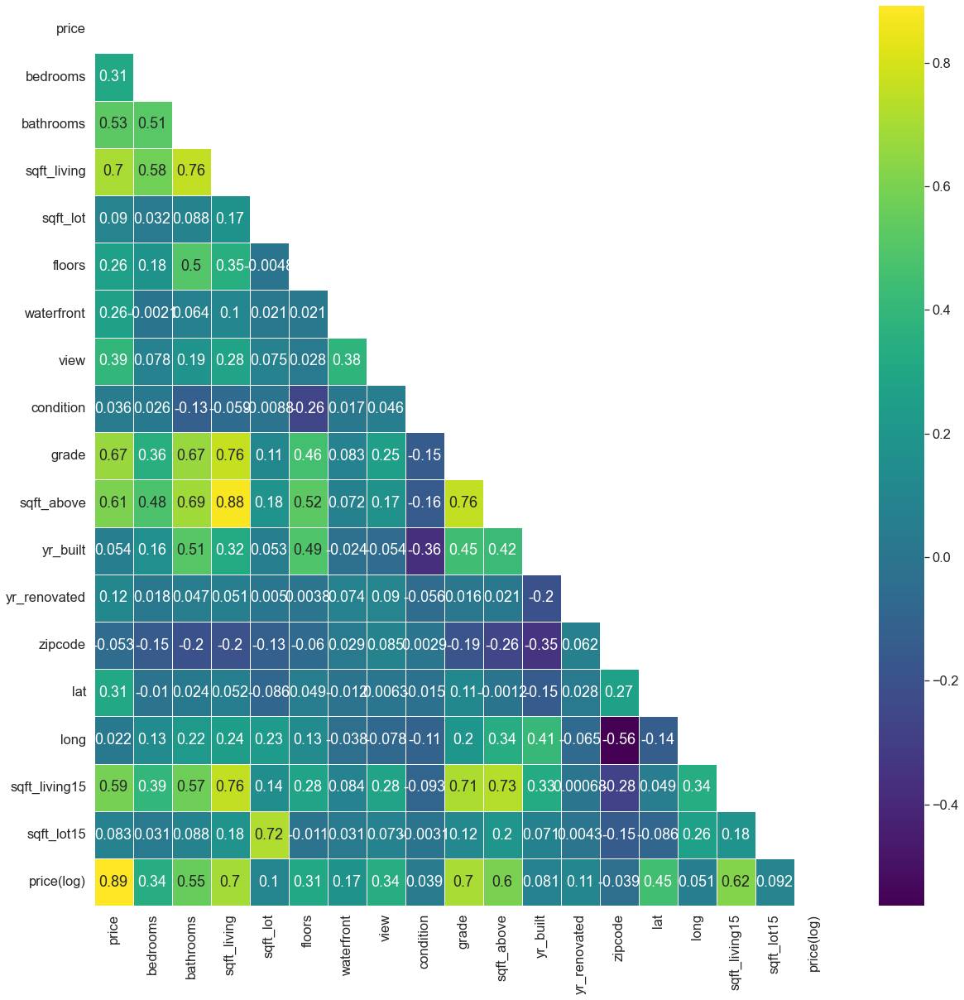

In [670]:
#plotting the correlation matrix on the given data to see how each column correlates to another
county_corr_data = king_county_df.drop(['id',], axis = 1)
plt.figure(figsize=(20, 20))
matrix = np.triu(county_corr_data.corr())
sns.heatmap(county_corr_data.corr(), annot=True,
            linewidth=.8, mask=matrix, cmap="viridis");

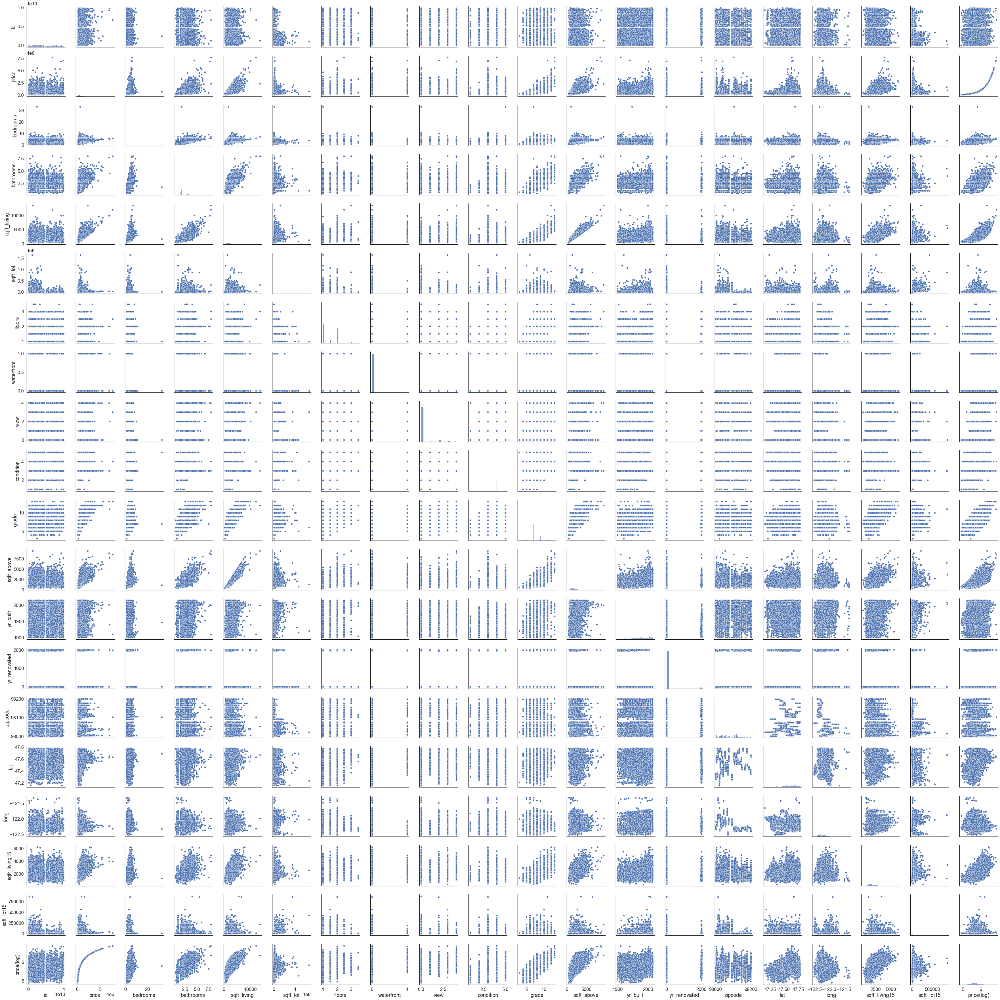

In [671]:
#Correlation between different columns in scatter plots
sns.pairplot(king_county_df)

array([[<AxesSubplot:title={'center':'id'}>,
        <AxesSubplot:title={'center':'date'}>,
        <AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'bedrooms'}>],
       [<AxesSubplot:title={'center':'bathrooms'}>,
        <AxesSubplot:title={'center':'sqft_living'}>,
        <AxesSubplot:title={'center':'sqft_lot'}>,
        <AxesSubplot:title={'center':'floors'}>],
       [<AxesSubplot:title={'center':'waterfront'}>,
        <AxesSubplot:title={'center':'view'}>,
        <AxesSubplot:title={'center':'condition'}>,
        <AxesSubplot:title={'center':'grade'}>],
       [<AxesSubplot:title={'center':'sqft_above'}>,
        <AxesSubplot:title={'center':'yr_built'}>,
        <AxesSubplot:title={'center':'yr_renovated'}>,
        <AxesSubplot:title={'center':'zipcode'}>],
       [<AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'long'}>,
        <AxesSubplot:title={'center':'sqft_living15'}>,
        <AxesSubplot:title={'center':'sqf

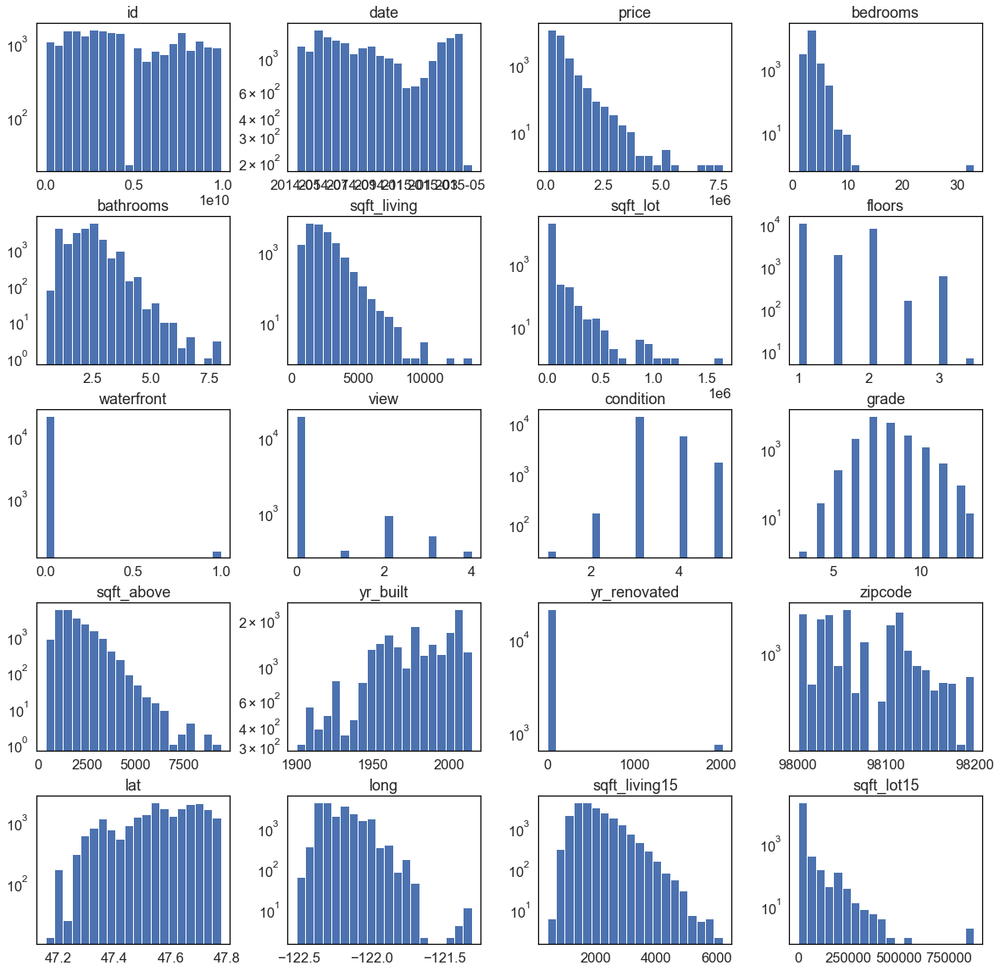

In [644]:
#visualizing different columns in histograms
king_county_df.hist(figsize = (20,20), bins=20, log=True) 

From the above distributions, We can see that the data such as price, bedrooms, bathrooms, sqft_living, sqft_lot, sqft_above, yr_built, zipcode, lat, long, sqft_living15 and sqft_lot15 are uniformly distributed. Whereas there are gaps in the data such as floors, grade, waterfront, view, condition and yr_renovated. Lets start with the uniformly distributed datasets.

### Average price of the houses

In the below cells, we calculate the average price of the houses per the year they have built

In [645]:
# Question 1: 
# We have to group by the houses that was sold in each of this year and then get their price and count each of them 
county_price = king_county_df[['yr_built', 'price']].groupby(['yr_built', 'price']).size().to_frame('count').reset_index()
county_price

,yr_built,price,count
0,1900,130000.000,1
1,1900,169900.000,1
2,1900,179000.000,1
3,1900,192500.000,1
4,1900,199999.000,1
...,...,...,...
17338,2015,1290000.000,2
17339,2015,1550000.000,1
17340,2015,1700000.000,1
17341,2015,1800000.000,1


### Plot

First we look if there is any relation between the Year_built and the price of the houses. Plot a 2D histogram (Heatmap) using those two 
columns with count as the weight of the heatmap

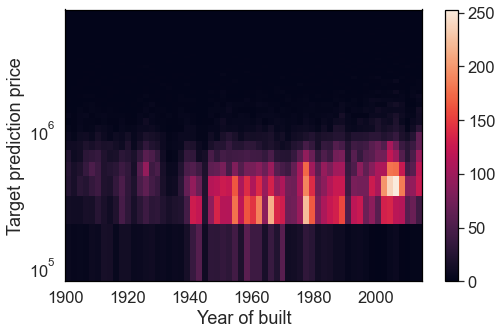

In [646]:
#Heat map of Year of built with the Target prediction price of the houses
plt.hist2d(county_price['yr_built'], county_price['price'], weights=county_price['count'], bins=(60, 60))
plt.yscale('log')
plt.xlabel('Year of built')
plt.ylabel('Target prediction price')
plt.colorbar()
plt.show()

Conclusion:

We can see that there are more houses with higher target prediction price in later 20's compared to early 90's which actually make sense!

Calculating the Average price of the houses below:

In [647]:
#calculate the price of the house per count and store it as 'price_x_count'
county_price.eval('price_x_count = price * count', inplace=True)
#From the above dataframe, we groupby the year_built to get the number of such year and then add them using their count
no_of_year = county_price.groupby('yr_built')['count'].sum()
#Here we calculate the average price of the houses using the no_of_year we got from above 
price_avg = county_price.groupby('yr_built')['price_x_count'].sum()/no_of_year
#Round the values 
#price_avg = round(price_avg, -3)
price_avg#.head(50)

yr_built
1900   581536.632
1901   557108.345
1902   673192.593
1903   480958.196
1904   583867.756
          ...    
2011   544648.385
2012   527436.982
2013   678599.582
2014   683792.685
2015   759970.947
Length: 116, dtype: float64

Here we plot the Average price of the houses with the year it was built using a bar plot in Matplotlib

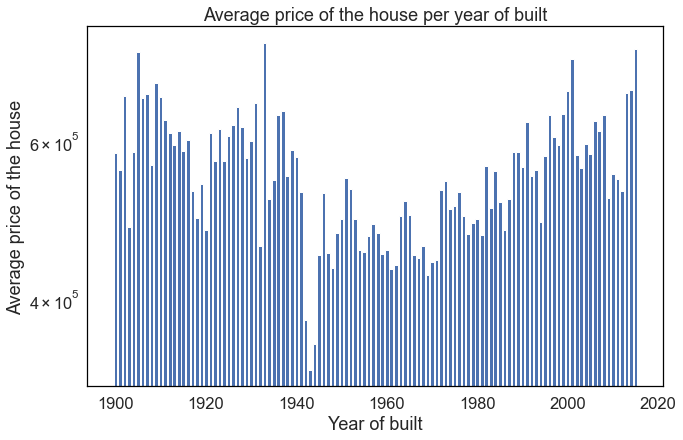

In [669]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
year = pd.unique(king_county_df['yr_built'].sort_values(ascending=True))
ax.bar(year, price_avg)
plt.title('Average price of the house per year of built')
plt.xlabel('Year of built')
plt.ylabel('Average price of the house')
plt.yscale('log')
plt.show()


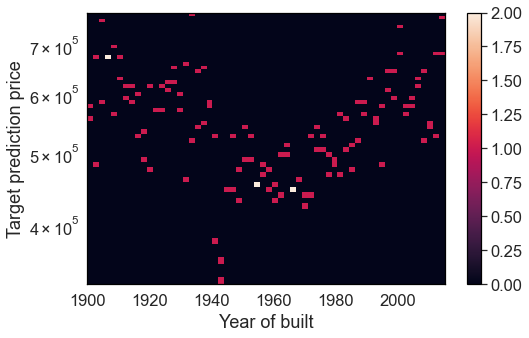

In [723]:
plt.hist2d(year, price_avg, bins=(60, 60))#weights=county_price['count'], bins=(60, 60))
plt.yscale('log')
plt.xlabel('Year of built')
plt.ylabel('Target prediction price')
plt.colorbar()
plt.show()

### Conclusion

My assumption before plotting was that the prediction target price of the houses will be highly related to the year 
in which the houses were built. Then the houses that were built in early 90's will have less price compared to the 
ones that were built in late 2000. From the above plot, we don't see any direct relationship between the year of built 
of the house and the average price of those houses. 
The data is highly fluctuating. This can be due to various reasons:
- The houses built in early 90's can be larger or have similar size compared to the ones built in 2000. 
- May be the houses that were built in early 90's were extensively renovated later and have similar 
  amenities that today's buyers are seeking
More analysis have to be done to get a clear trend

### Let's see the correlation of the features of the houses with the price <br>
Thinking about the possible reason behind the above behaviour, let's check how the features of each of these houses such as area, <br> 
no. of rooms et.. are related to the price of the house

In [649]:
#convert the price to log10 scale so that its easy to visualize
king_county_df['price(log)'] = np.log10(king_county_df['price'])
king_county_df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price(log)
0,7129300520,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0.000,0.000,...,1180,0.0,1955,0.000,98178,47.511,-122.257,1340,5650,5.346
1,6414100192,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0.000,0.000,...,2170,400.0,1951,1991.000,98125,47.721,-122.319,1690,7639,5.731
2,5631500400,2015-02-25,180000.000,2,1.000,770,10000,1.000,0.000,0.000,...,770,0.0,1933,0.000,98028,47.738,-122.233,2720,8062,5.255
3,2487200875,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0.000,0.000,...,1050,910.0,1965,0.000,98136,47.521,-122.393,1360,5000,5.781
4,1954400510,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0.000,0.000,...,1680,0.0,1987,0.000,98074,47.617,-122.045,1800,7503,5.708


In [696]:
#Grouping by the number of each of the features of the house and price and then counting them and adding to a data frame
bath_county = king_county_df[['bathrooms', 'price(log)']].groupby(['bathrooms', 'price(log)']).size().to_frame('count_bath').reset_index()
bed_county = king_county_df[['bedrooms', 'price(log)']].groupby(['bedrooms', 'price(log)']).size().to_frame('count_bed').reset_index()
sqft_living_county = king_county_df[['sqft_living', 'price(log)']].groupby(['sqft_living', 'price(log)']).size().to_frame('count_sqft_living').reset_index()
sqft_lot_county = king_county_df[['sqft_lot', 'price(log)']].groupby(['sqft_lot', 'price(log)']).size().to_frame('count_sqft_lot').reset_index()
sqft_living_above_county = king_county_df[['sqft_above', 'price(log)']].groupby(['sqft_above', 'price(log)']).size().to_frame('count_sqft_above').reset_index()
sqft_living15_county = king_county_df[['sqft_living15', 'price(log)']].groupby(['sqft_living15', 'price(log)']).size().to_frame('count_living15').reset_index()
sqft_lot15 = king_county_df[['sqft_lot15', 'price(log)']].groupby(['sqft_lot15', 'price(log)']).size().to_frame('count_lot15').reset_index()
sqft_living_county

,sqft_living,price(log),count_sqft_living
0,370,5.441,1
1,380,5.389,1
2,390,5.389,1
3,410,5.512,1
4,420,5.360,1
...,...,...,...
19563,9640,6.669,1
19564,9890,6.838,1
19565,10040,6.849,1
19566,12050,6.886,1


### Plot <br>
Here we plot the correlation of each of the above features of the houses with the prices in log scale

<AxesSubplot:xlabel='price(log)', ylabel='sqft_living15'>

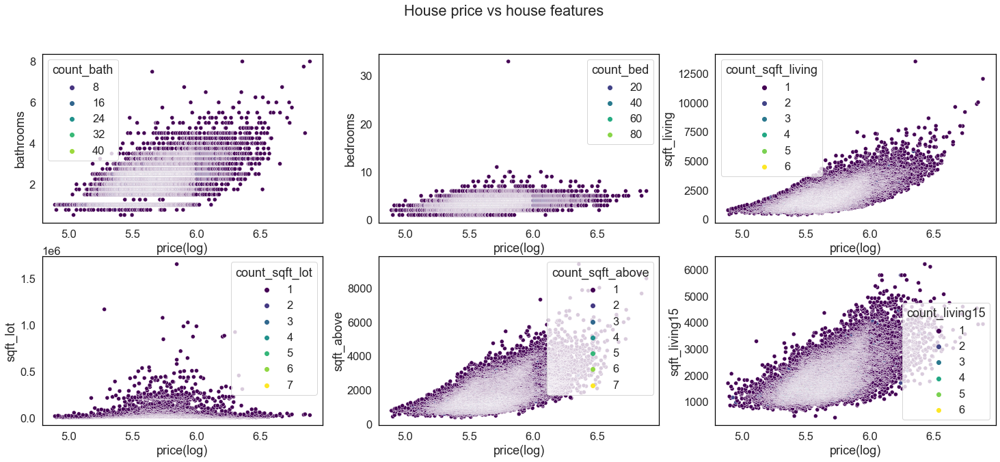

In [739]:
fig, axes = plt.subplots(2, 3, figsize=(25, 10))

fig.suptitle('House price vs house features')

sns.scatterplot(ax=axes[0, 0], data=bath_county, x='price(log)', y='bathrooms', hue='count_bath', palette='viridis')
sns.scatterplot(ax=axes[0, 1], data=bed_county, x='price(log)', y='bedrooms', hue='count_bed', palette='viridis')
sns.scatterplot(ax=axes[0, 2], data=sqft_living_county, x='price(log)', y='sqft_living', hue='count_sqft_living', palette='viridis')
sns.scatterplot(ax=axes[1, 0], data=sqft_lot_county, x='price(log)', y='sqft_lot', hue='count_sqft_lot', palette='viridis')
sns.scatterplot(ax=axes[1, 1], data=sqft_living_above_county, x='price(log)', y='sqft_above', hue='count_sqft_above', palette='viridis')
sns.scatterplot(ax=axes[1, 2], data=sqft_living15_county, x='price(log)', y='sqft_living15', hue='count_living15', palette='viridis')

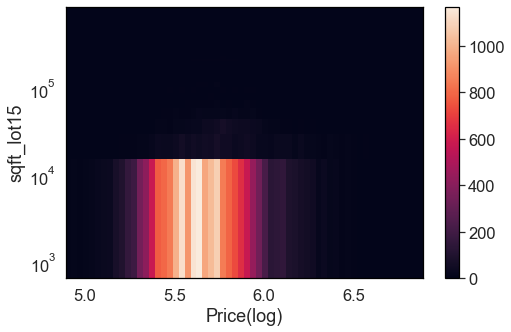

In [776]:
plt.hist2d(sqft_lot15['price(log)'], sqft_lot15['sqft_lot15'], bins=(60, 60))
plt.yscale('log')
plt.xlabel('Price(log)')
plt.ylabel('sqft_lot15')
plt.colorbar()
plt.show()

We can see that almost all features except the sqft_lot are highly correlated to the price of the houses

### Let's see the correlation of these features with the year in which the houses was built<br>
Lets see how the above features of the house relate to the year in which they are built. If we see a similar correlation there, we can say that our <br> assumption on the correlation between 'price' and the 'year of built' is explainable with the features of the house.<br>

Since there are several houses built in the same year, lets visualize this in a heat map using the corresponding counts

In [764]:
#Grouping by the number of features of the house and the year_built and then counting them and adding to a new data frame
bath_county_year = king_county_df[['bathrooms', 'yr_built']].groupby(['bathrooms', 'yr_built']).size().to_frame('count_bath').reset_index()
bed_county_year = king_county_df[['bedrooms', 'yr_built']].groupby(['bedrooms', 'yr_built']).size().to_frame('count_bed').reset_index()
sqft_living_county_year = king_county_df[['sqft_living', 'yr_built']].groupby(['sqft_living', 'yr_built']).size().to_frame('count_sqft_living').reset_index()
sqft_lot_county_year = king_county_df[['sqft_lot', 'yr_built']].groupby(['sqft_lot', 'yr_built']).size().to_frame('count_sqft_lot').reset_index()
sqft_living_above_county_year = king_county_df[['sqft_above', 'yr_built']].groupby(['sqft_above', 'yr_built']).size().to_frame('count_sqft_above').reset_index()
sqft_living15_county_year = king_county_df[['sqft_living15', 'yr_built']].groupby(['sqft_living15', 'yr_built']).size().to_frame('count_living15').reset_index()
sqft_lot15_year = king_county_df[['sqft_lot15', 'yr_built']].groupby(['sqft_lot15', 'yr_built']).size().to_frame('count_lot15').reset_index()
sqft_lot_county_year

,sqft_lot,yr_built,count_sqft_lot
0,520,1900,1
1,572,2006,1
2,600,2004,1
3,609,2011,1
4,635,2008,1
...,...,...,...
18825,982998,1992,1
18826,1024068,2006,1
18827,1074218,1931,1
18828,1164794,1915,1


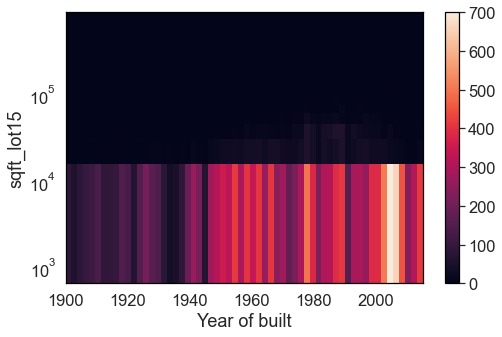

In [775]:
plt.hist2d(sqft_lot15_year['yr_built'], sqft_lot15_year['sqft_lot15'], bins=(60, 60))
plt.yscale('log')
plt.xlabel('Year of built')
plt.ylabel('sqft_lot15')
plt.colorbar()
plt.show()

From the above histogram we can see that there are more houses with larger home footage in the later years which explains the year vs price plot
shown above. That is why most of the houses built in the later years have higher price

### Location of houses 

In the below cells, we do different calculations on the housing data and plot the findings in maps with real locations. So that we can <br>
see whether the price and the year in which the houses are built has anything to do with the location of the houses.

In [674]:
#Q3
#Lets get all the columns we are interested in from the original data frame
bath_county_all = king_county_df[['price', 'yr_built', 'lat', 'long', 'zipcode', 'sqft_living', 'bathrooms', 'bedrooms', 'yr_renovated']]
bath_county_all


,price,yr_built,lat,long,zipcode,sqft_living,bathrooms,bedrooms,yr_renovated
0,221900.000,1955,47.511,-122.257,98178,1180,1.000,3,0.000
1,538000.000,1951,47.721,-122.319,98125,2570,2.250,3,1991.000
2,180000.000,1933,47.738,-122.233,98028,770,1.000,2,0.000
3,604000.000,1965,47.521,-122.393,98136,1960,3.000,4,0.000
4,510000.000,1987,47.617,-122.045,98074,1680,2.000,3,0.000
...,...,...,...,...,...,...,...,...,...
21592,360000.000,2009,47.699,-122.346,98103,1530,2.500,3,0.000
21593,400000.000,2014,47.511,-122.362,98146,2310,2.500,4,0.000
21594,402101.000,2009,47.594,-122.299,98144,1020,0.750,2,0.000
21595,400000.000,2004,47.535,-122.069,98027,1600,2.500,3,0.000


Lets add another column 'year_of_built' from the above 'year' column where we check whether the houses are built before or after 1980.<br> 
So its easier for us to see the location of the houses bases on these difference and thereby its easier to include more features on the <br>
map which can correlate to the price of the houses.


In [715]:
#checking the year condition on the dataset  
bath_county_all_condition =  bath_county_all.eval('year_of_built = yr_built > 1980')
bath_county_all_condition 


,price,yr_built,lat,long,zipcode,sqft_living,bathrooms,bedrooms,yr_renovated,year_of_built
0,221900.000,1955,47.511,-122.257,98178,1180,1.000,3,0.000,False
1,538000.000,1951,47.721,-122.319,98125,2570,2.250,3,1991.000,False
2,180000.000,1933,47.738,-122.233,98028,770,1.000,2,0.000,False
3,604000.000,1965,47.521,-122.393,98136,1960,3.000,4,0.000,False
4,510000.000,1987,47.617,-122.045,98074,1680,2.000,3,0.000,True
...,...,...,...,...,...,...,...,...,...,...
21592,360000.000,2009,47.699,-122.346,98103,1530,2.500,3,0.000,True
21593,400000.000,2014,47.511,-122.362,98146,2310,2.500,4,0.000,True
21594,402101.000,2009,47.594,-122.299,98144,1020,0.750,2,0.000,True
21595,400000.000,2004,47.535,-122.069,98027,1600,2.500,3,0.000,True


In [779]:
#count how many houses before 1980 and after 1980
bath_county_all_condition['year_of_built'].value_counts()

< 1980    12568
> 1980     9029
Name: year_of_built, dtype: int64

In [716]:
#Here we use a mask method to transform the year_of_built column from bool to a string so that it can directly be used 
#as a legend in the maps below

mask = bath_county_all_condition.applymap(type) != bool
d = {True: '> 1980', False: '< 1980'}

bath_county_all_condition = bath_county_all_condition.where(mask, bath_county_all_condition.replace(d))
bath_county_all_condition

,price,yr_built,lat,long,zipcode,sqft_living,bathrooms,bedrooms,yr_renovated,year_of_built
0,221900.000,1955,47.511,-122.257,98178,1180,1.000,3,0.000,< 1980
1,538000.000,1951,47.721,-122.319,98125,2570,2.250,3,1991.000,< 1980
2,180000.000,1933,47.738,-122.233,98028,770,1.000,2,0.000,< 1980
3,604000.000,1965,47.521,-122.393,98136,1960,3.000,4,0.000,< 1980
4,510000.000,1987,47.617,-122.045,98074,1680,2.000,3,0.000,> 1980
...,...,...,...,...,...,...,...,...,...,...
21592,360000.000,2009,47.699,-122.346,98103,1530,2.500,3,0.000,> 1980
21593,400000.000,2014,47.511,-122.362,98146,2310,2.500,4,0.000,> 1980
21594,402101.000,2009,47.594,-122.299,98144,1020,0.750,2,0.000,> 1980
21595,400000.000,2004,47.535,-122.069,98027,1600,2.500,3,0.000,> 1980


Let's plot a map using the location of these houses and see where are they located in general based on their price.

In [717]:
#using scatter_mapbox from plotly to do that 
fig = px.scatter_mapbox(bath_county_all, lat="lat", lon="long", color="price", hover_data=["yr_built"],
                       color_continuous_scale=px.colors.sequential.Viridis, size_max=15, zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":10,"t":10,"l":10,"b":10})
fig.show()

Now lets see how the location of the houses and the year in which the houses built looks like! If we see a similar behavior as above, <br> 
we can say that the factors that we accounted from the above plots can are reasonable

### Conclusion:<br>
From the above map with the location of the houses and their corresponding price, it doesn't directly show a clear correlation with the location of the houses and the price at which they are sold or bought. But we do see some trend in some areas on the map such as ---- where the price of most of the houses are expensive compared to other regions. This can be explained using several factors.

In [781]:
#using scatter_mapbox from plotly to do that 
fig = px.scatter_mapbox(bath_county_all, lat="lat", lon="long", color="yr_built",
                       color_continuous_scale=px.colors.sequential.Viridis, size_max=15, zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":10,"t":10,"l":10,"b":10})
fig.show()

In [718]:
#using yr_of_built with binary values(>/< 2000) as the value for the 'color' argument so that we can classify the locations 
# in 2 classes with 2 different colours
fig = px.scatter_mapbox(bath_county_all_condition, lat="lat", lon="long", color="year_of_built",
                       color_discrete_sequence=["red", 'blue'], size_max=15, zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":10,"t":10,"l":10,"b":10})
fig.show()

In [720]:
#Creating a new dataframe by droping the missing values, sorting the years and converting it to an int at the end
year_reno = king_county_df.query('yr_renovated != 0').dropna(axis=0, subset=['yr_renovated'])
year_reno.sort_values('yr_renovated', inplace=True)
year_reno['yr_renovated'] = year_reno.yr_renovated.apply(lambda x: int(x));

Let's calculate the number of houses renovated in each of these years!<br>
Hence we can see if the expensive houses built before 1980 are renovated or not using the location of those houses. 

<Figure size 576x360 with 0 Axes>

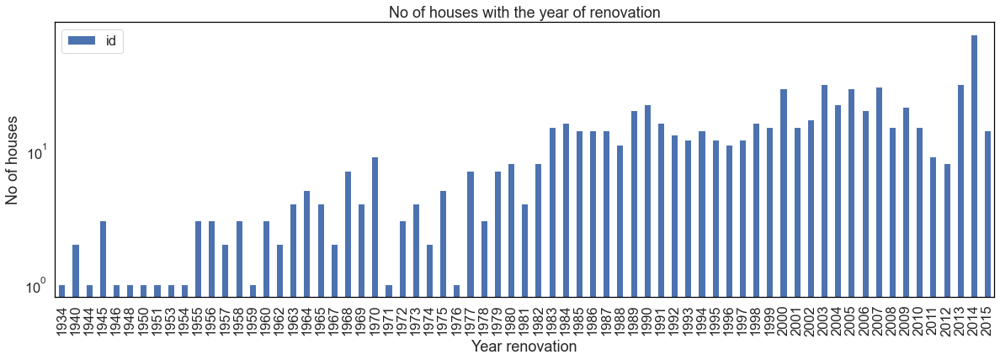

In [780]:
#Ploting the number of houses renovated in each year by counting the number of houses per year
plt.figure()
year_reno_count = year_reno.groupby('yr_renovated').count()

year_reno_count.plot(y='id', kind='bar', figsize=(20, 6))
plt.xlabel('Year renovation')
plt.ylabel('No of houses')
plt.title('No of houses with the year of renovation')
plt.yscale('log')

In [722]:
#location of the houses with the year of rennovation
fig = px.scatter_mapbox(year_reno, lat="lat", lon="long", color="yr_renovated",
                       color_continuous_scale=px.colors.sequential.Viridis, size_max=15, zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":10,"t":10,"l":10,"b":10})
fig.show()

In [782]:
#using scatter_mapbox from plotly to do that 
fig = px.scatter_mapbox(bath_county_all, lat="lat", lon="long",
                       color_continuous_scale=px.colors.sequential.Viridis, size_max=15, zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":10,"t":10,"l":10,"b":10})
fig.show()

Conclusion: Most number of houses did their renovation after the year 1970